# Imports

In [1]:
import subprocess
from copy import deepcopy
from pathlib import Path

import trimesh
import pymeshfix
import cc3d
import ipywidgets as widgets
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import nibabel as nib
from nibabel.freesurfer.io import read_geometry, write_geometry
from skimage import measure
from parse import parse
from tqdm.notebook import tqdm
from PIL import Image, ImageFont, ImageDraw
import pandas as pd

import mne
from mne.surface import decimate_surface, _triangle_neighbors
from mne.bem import _get_solids
from mne.io.constants import FIFF
from mne.viz import plot_alignment, set_3d_view

from eegip.atlas import Atlas
from eegip import DatasetMng

# Global variables for the notebook

In [2]:
subjects = ["ANTS2-0Weeks3T", "ANTS1-0Months3T", "ANTS2-0Months3T", "ANTS3-0Months3T", 
            "ANTS4-5Months3T", "ANTS6-0Months3T", "ANTS7-5Months3T", "ANTS9-0Months3T", 
            "ANTS12-0Months3T", "ANTS15-0Months3T", "ANTS18-0Months3T", "ANTS2-0Years3T"]
                
root = Path("/media/christian/ElementsSE/Richards")

image_output_path = Path("/home/christian/Dropbox/Publications (current)/Journal/infants atlas/")

fs_subject_path = Path("/usr/local/freesurfer/subjects/")

# Cerebellum cortex/wm distinction is not available
# in the youngest infants
labels_vol = [#'Left-Accumbens-area',
             'Left-Amygdala',
             'Left-Caudate',
             #'Left-Cerebellum-Cortex',
             #'Left-Cerebellum-White-Matter',
             'Left-Hippocampus',
             'Left-Pallidum',
             'Left-Putamen',
             'Left-Thalamus',
             #'Right-Accumbens-area',
             'Right-Amygdala',
             'Right-Caudate',
             #'Right-Cerebellum-Cortex',
             #'Right-Cerebellum-White-Matter',
             'Right-Hippocampus',
             'Right-Pallidum',
             'Right-Putamen',
             'Right-Thalamus']     
    
out = widgets.Output(layout={'border': '1px solid black'})


config = {"atlas": {"vol_labels": labels_vol}}     

ages = {"ANTS2-0Weeks3T_brain": "2 weeks",
          "ANTS1-0Months3T_brain": "1 month",
          "ANTS2-0Months3T_brain": "2 months", 
          "ANTS3-0Months3T_brain": "3 months", 
          "ANTS4-5Months3T_brain": "4.5 months", 
          "ANTS6-0Months3T_brain": "6 months", 
          "ANTS7-5Months3T_brain": "7.5 months", 
          "ANTS9-0Months3T_brain": "9 months", 
          "ANTS12-0Months3T_brain": "12 months", 
          "ANTS15-0Months3T_brain": "15 months", 
          "ANTS18-0Months3T_brain": "18 months", 
          "ANTS2-0Years3T_brain": "24 months"}     


# Definition of various functions used throughout the notebook 

In [3]:
def check_bem(subject_):
    atlas_ = Atlas(subjects_dir=fs_subject_path, fs_subject=subject_)
    atlas_.build_bem(labels_vol=labels_vol)
    atlas_.mesh_atlas_pacels()
    atlas_.compute_pacels_centers_of_masse()


# In some of our MRI, there appears to have artifacts that shows like small line segments
# over the background. We correct these by zeroing any small separated clusted of non null 
# voxels.    
def correct_line_artefact(epi_img_data_):
    components = cc3d.connected_components((epi_img_data_ != 0).astype(int))
    label_id, count = np.unique(components, return_counts=True)
    id_zero, id_non_zero = label_id[count > 100000]
    ind_artefact = np.where((components != id_zero) & (components != id_non_zero))
    epi_img_data_[ind_artefact] = 0

    
def process_bem(bem_path_):
    """
     Main function for BEM extraction.
    """
    subject_ = bem_path_.name.split("_")[0].replace("AVG", "ANTS").replace("_edited", "")

    epi_img_ = nib.load(str(bem_path_))

    for file_name_, discard_inds in zip(["outer_skin.surf", "outer_skull.surf", "inner_skull.surf"],
                                       [[1, 2, 3, 4], [1, 2, 3], [1, 2]]):
        epi_img_data_ = deepcopy(epi_img_.get_fdata())

        correct_line_artefact(epi_img_data_)

        cond = np.stack([(epi_img_data_ == i_) for i_ in discard_inds]).sum(0)
        epi_img_data_[np.where(cond)] = 1
        epi_img_data_[np.where(np.logical_not(cond))] = 0
        vertices, simplices = measure.marching_cubes_lewiner(epi_img_data_, spacing=(1, 1, 1),
                                                             allow_degenerate=False)[:2]

        path_white = fs_subject_path / (subject_ + "_brain") / "surf" / "lh.white"

        try:
            volume_info_ = read_geometry(path_white, read_metadata=True)[2]
        except:
            print("Skipping subject {}...".format(subject_))
            continue

        vertices = vertices @ epi_img_.affine[:3, :3] + epi_img_.affine[:3, 3] - volume_info_["cras"]

        mesh_ = trimesh.Trimesh(vertices=vertices, faces=simplices)
        trimesh.repair.fix_normals(mesh_, multibody=False)

        smooth_mesh = trimesh.smoothing.filter_laplacian(deepcopy(mesh_), lamb=0.8, iterations=15,
                                                         volume_constraint=True)

        bem_output_path_ = fs_subject_path / subject_ / "bem"
        bem_output_path_.mkdir(parents=True, exist_ok=True)

        vertices, faces_ = smooth_mesh.vertices, smooth_mesh.faces

        # Defect corrections for the large meshes
        vertices, faces_ = fix_all_defects(vertices, faces_)

        # Writing a freesufer mesh file
        file_name_large = file_name_.split(".")[0] + "_large.surf"
        write_geometry(str(bem_output_path_ / file_name_large),
                       vertices, faces_)

        # Writing an obj mesh file
        with (bem_output_path_ / file_name_large).with_suffix(".obj").open('w') as file_obj:
            file_obj.write(trimesh.exchange.obj.export_obj(trimesh.Trimesh(vertices, faces_)))

        # Decimating BEM surfaces
        vertices, faces_ = decimate_surface(vertices, faces_,
                                           n_triangles=5120)

        # Defect correction for decimated meshes...
        vertices, faces_ = fix_all_defects(vertices, faces_)

        # Writing an obj mesh file
        with (bem_output_path_ / file_name_).with_suffix(".obj").open('w') as file_obj:
            file_obj.write(trimesh.exchange.obj.export_obj(trimesh.Trimesh(vertices, faces_)))

        # Writing a freesufer mesh file
        print("Writing {}...".format(str(bem_output_path_ / file_name_)))
        write_geometry(str(bem_output_path_ / file_name_),
                       vertices, faces_, volume_info=volume_info_)
        

def check_mesh(vertices, faces_):
    assert (surface_is_complete(vertices, faces_))
    assert (not has_topological_defects(vertices, faces_))
    assert (not has_degenerated_faces(vertices, faces_))
    assert trimesh.Trimesh(vertices, faces_).is_watertight     
        
        
def fix_all_defects(vertices, faces_):   
    if has_degenerated_faces(vertices, faces_):
        vertices, faces_ = remove_degenerated_faces(vertices, faces_)
    assert (not has_degenerated_faces(vertices, faces_))

    if has_topological_defects(vertices, faces_):
        print("The decimated mesh has topological defects. Fixing it.")
        vertices, faces_ = fix_topological_defects(vertices, faces_)
        if has_degenerated_faces(vertices, faces_):
            vertices, faces_ = remove_degenerated_faces(vertices, faces_)
        assert (not has_topological_defects(vertices, faces_))

    if not surface_is_complete(vertices, faces_):
        print("The decimated mesh has holes. Fixing it.")
        vertices, faces_ = repair_holes(vertices, faces_)

    check_mesh(vertices, faces_)

    return vertices, faces_      
            
        
def surface_is_complete(vertices, faces_):
    """Check the sum of solid angles as seen from inside."""
    cm = vertices.mean(axis=0)
    tot_angle = _get_solids(vertices[faces_], cm[np.newaxis, :])[0]
    prop = tot_angle / (2 * np.pi)
    return np.abs(prop - 1.0) < 1e-5


def correction_two_neighboring_tri(vertices, faces_, faulty_vert_ind):
    ind_faces_to_remove = []
    new_faces = []
    for ind in faulty_vert_ind:
        ind_faces = np.where(faces_ == ind)[0]
        ind_faces_to_remove.extend(ind_faces)
        face1, face2 = faces_[ind_faces]
        new_face = np.unique(np.concatenate((face1, face2)))
        new_face = np.delete(new_face, np.where(new_face == ind))
        assert (len(new_face) == 3)  # If == 4, it means that face1 and face2 do not share a common edge

        new_det = np.linalg.det(vertices[new_face])
        assert new_det  # If zero, the three points are colinear

        # Align the normals
        det1 = np.linalg.det(vertices[face1])
        if np.sign(det1) == np.sign(new_det):
            new_face = new_face[[1, 0, 2]]

        new_faces.append(new_face)

    return np.array(ind_faces_to_remove, dtype=int), new_faces
    
    
def reindex_vertices(vertices, faces_, ind_vertices_to_remove):
    decrement = np.cumsum(np.zeros(vertices.shape[0], dtype=int) +
                          np.in1d(np.arange(vertices.shape[0]), ind_vertices_to_remove))
    vertices = np.delete(vertices, ind_vertices_to_remove, axis=0)
    faces_ = faces_ - decrement[faces_]
    return vertices, faces_
    
    
def get_topological_defects(vertices, faces_):
    #    Find neighboring triangles, accumulate vertex normals, normalize
    neighbor_tri = _triangle_neighbors(faces_, len(vertices))

    #   Check for topological defects
    zero, one, two = list(), list(), list()
    for ni, n in enumerate(neighbor_tri):
        if len(n) < 3:
            if len(n) == 0:
                zero.append(ni)
            elif len(n) == 1:
                one.append(ni)
            else:
                two.append(ni)

    return zero, one, two
    
    
def has_topological_defects(vertices, faces_):
    zero, one, two = get_topological_defects(vertices, faces_)
    return len(zero) or len(one) or len(two)
        
    
# Code extracted and slighly modified from mne.surface.complete_surface_info
# for compactness of the example
def fix_topological_defects(vertices, faces_):
    zero, one, two = get_topological_defects(vertices, faces_)
    ind_faces_to_remove = []
    if len(zero) > 0:
        print('    Vertices do not have any neighboring '
              'triangles: [%s]' % ', '.join(str(z) for z in zero))
        print('    Correcting by removing these vertices.')

    if len(one) > 0:
        print('    Vertices have only one neighboring '
              'triangles: [%s]'
              % ', '.join(str(tri) for tri in one))
        print('    Correcting by removing these vertices and their neighboring triangles.')
        ind_faces_to_remove.extend(np.where(faces_ == one)[0].tolist())

    if len(two) > 0:
        print('    Vertices have only two neighboring '
              'triangles, removing neighbors: [%s]'
              % ', '.join(str(tri) for tri in two))
        print('    Correcting by merging the two neighboring '
              'triangles and removing the faulty vertices.')

        ind_faces, faces_to_add = correction_two_neighboring_tri(vertices, faces_, two)
        ind_faces_to_remove.extend(ind_faces)
        faces_ = np.concatenate((np.delete(faces_, np.array(ind_faces_to_remove, dtype=int), axis=0), faces_to_add))

    vertices_to_remove = np.concatenate((zero, one, two)).astype(int)
    if len(vertices_to_remove):
        vertices, faces_ = reindex_vertices(vertices, faces_, vertices_to_remove)
    else:
        print("No issue found with the mesh.")

    return vertices, faces_
        

def has_degenerated_faces(vertices, faces_):
    return not np.all(trimesh.Trimesh(vertices, faces_).remove_degenerate_faces())


def remove_degenerated_faces(vertices, faces_):
    mesh_ = trimesh.Trimesh(vertices, faces_)
    mesh_.remove_degenerate_faces()
    return mesh_.vertices, mesh_.faces  

    
def repair_holes(vertices, faces_):
    # trimesh has a hole fixing function, but it just deals with
    # 3 or 4 vertices holes.
    meshfix = pymeshfix.MeshFix(vertices, faces_)
    meshfix.repair()
    vertices = meshfix.v  # numpy np.float array
    faces_ = meshfix.f  # numpy np.int32 array

    # The return mesh has a solid angle of -1 instead of 1.
    # Correcting this.
    mesh_ = trimesh.Trimesh(vertices=vertices, faces=faces_)
    trimesh.repair.fix_normals(mesh_, multibody=False)
    return mesh_.vertices, mesh_.faces


def show_slices(slices):
    """ Function to display row of image slices """
    axes_ = plt.subplots(1, len(slices), figsize=(12, 5))[1]
    for slice_, ax_ in zip(slices, axes_):
        ax_.imshow(slice_.T, cmap="gray", origin="lower")
        

def save_sfp_montage(montage, fpath):
    assert (montage.dig[0]["kind"] == FIFF.FIFFV_POINT_CARDINAL and
            montage.dig[0]["ident"] == FIFF.FIFFV_POINT_LPA)
    assert (montage.dig[1]["kind"] == FIFF.FIFFV_POINT_CARDINAL and
            montage.dig[1]["ident"] == FIFF.FIFFV_POINT_NASION)
    assert (montage.dig[2]["kind"] == FIFF.FIFFV_POINT_CARDINAL and
            montage.dig[2]["ident"] == FIFF.FIFFV_POINT_RPA)

    with fpath.open("w") as file_obj:
        for dig_, name in zip(montage.dig[:3], ["FidT9", "FidNz", "FidT10"]):
            file_obj.write("{}\t{}\t{}\t{}\n".format(name, dig_["r"][0], dig_["r"][1], dig_["r"][2]))
        for dig_, name in zip(montage.dig[3:], montage.ch_names):
            file_obj.write("{}\t{}\t{}\t{}\n".format(name, dig_["r"][0], dig_["r"][1], dig_["r"][2]))


# Displaying the different types of MRI images provided by Richards et al.

In [4]:
subject = "ANTS12-0Months3T"

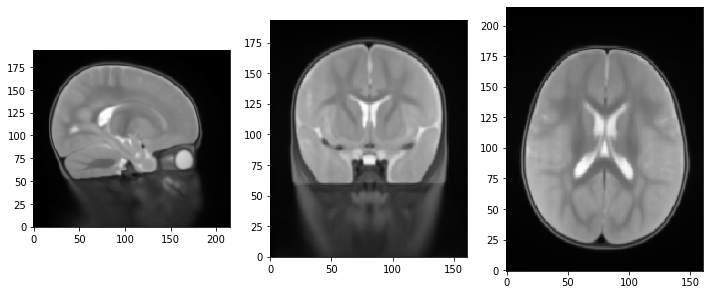

In [5]:
epi_img = nib.load(str(root / "Infants" / "Head" / "{}_t2w_head.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[100, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

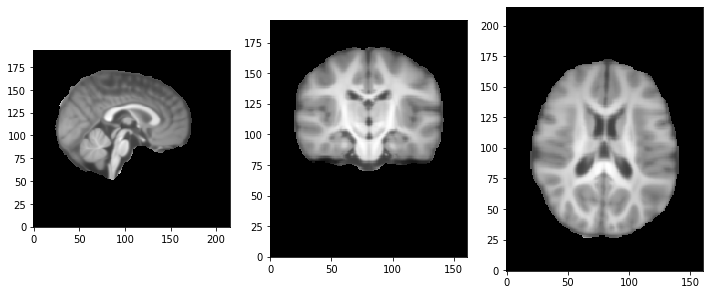

In [6]:
epi_img = nib.load(str(root / "Infants" / "Head" / "{}_head_brain.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[80, :, :]
slice_1 = epi_img_data[:, 100, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

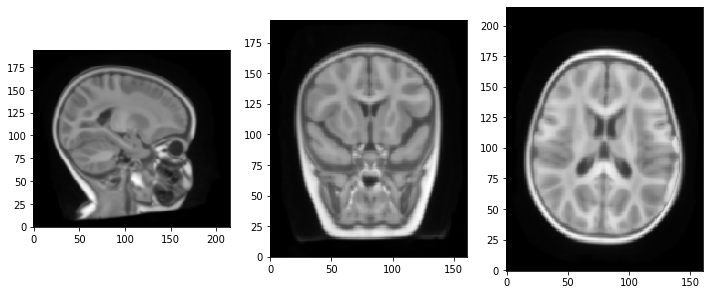

In [7]:
epi_img = nib.load(str(root / "Infants" / "Head" / "{}_head_bias_corrected.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[100, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

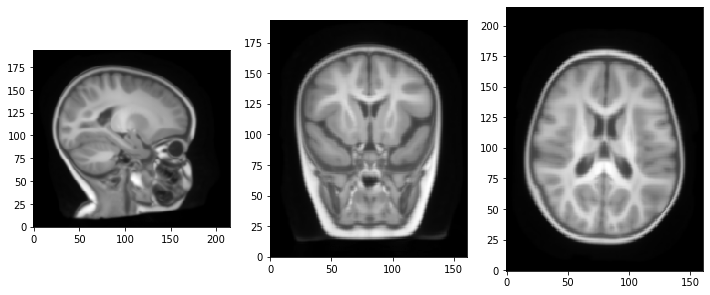

In [8]:
epi_img = nib.load(str(root / "Infants" / "Head" / "{}_head.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[100, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

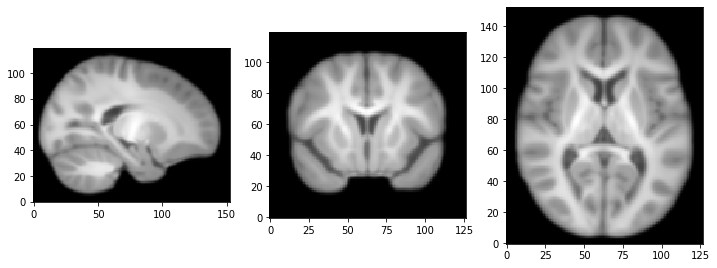

In [9]:
epi_img = nib.load(str(root / "Infants" / "Brain" / "{}_brain.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[80, :, :]
slice_1 = epi_img_data[:, 100, :]
slice_2 = epi_img_data[:, :, 60]
show_slices([slice_0, slice_1, slice_2])

The file marked as corrected seems to have artifacts that cause problems. Thus, we use the non-corrected ones. According to John Richards using the uncorrected files is fine with this version of the database since the correction was mainly important for T1.5 scans and our averages are based on T3 scans.

# Making aliases so that the infant_recon_all command find what it is looking for

Richards database has two types of averages, at brain level and at head level. We reconstruct surfaces for the two types of averages. We used subjects names ANTS\*3T for head averages and ANTS\*3T_brain for brain averages.

In [10]:
for target in fs_subject_path.glob("ANTS*3T/ANTS*3T_head.nii.gz"):
    ln_path = target.parent / "mprage.nii.gz"
    if not ln_path.exists():
        ln_path.symlink_to(target=target)
        print("{} link created.".format(ln_path))

In [11]:
for target in fs_subject_path.glob("ANTS*3T_brain/ANTS*3T_brain.nii.gz"):
    ln_path = target.parent / "mprage.nii.gz"
    if not ln_path.exists():
        ln_path.symlink_to(target=target)
        print("{} link created.".format(ln_path))

In [12]:
for target in fs_subject_path.glob("ANTS*3T/ANTS*3T_head_brain.nii.gz"):
    ln_path = target.parent / "brainmask.nii.gz"
    if not ln_path.exists():
        ln_path.symlink_to(target=target)
        print("{} link created.".format(ln_path))

In [13]:
for target in fs_subject_path.glob("ANTS*3T_brain/ANTS*3T_brain.nii.gz"):
    ln_path = target.parent / "brainmask.nii.gz"
    if not ln_path.exists():
        ln_path.symlink_to(target=target)
        print("{} link created.".format(ln_path))

# Commands for running intensity normalization for the brain masks

In [14]:
for target in fs_subject_path.glob("ANTS*3T/brainmask.nii.gz"):
    command = "mri_nu_correct.mni --i {} \\\n                   --o {} --n 2"
    command = command.format(str(target), str(target.parent) + "/brainmask_nu.nii.gz")
    print(command)

mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS15-0Months3T/brai

In [15]:
for target in fs_subject_path.glob("ANTS*3T_brain/brainmask.nii.gz"):
    command = "mri_nu_correct.mni --i {} \\\n                   --o {} --n 2"
    command = command.format(str(target), str(target.parent) + "/brainmask_nu.nii.gz")
    print(command)

mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/brainmask_nu.nii.gz --n 2
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/brainmask.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/brainmask_nu.nii.gz --n 2
mri_nu_correct.

# Commands for converting the volume in the "conform" space

In [16]:
for target in fs_subject_path.glob("ANTS*3T/brainmask_nu.nii.gz"):
    command = "mri_convert --conform {target} {target}".format(target=target)
    print(command)

mri_convert --conform /usr/local/freesurfer/subjects/ANTS7-5Months3T/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS7-5Months3T/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS6-0Months3T/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS6-0Months3T/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS15-0Months3T/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS15-0Months3T/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS1-0Mo

In [17]:
for target in fs_subject_path.glob("ANTS*3T/mprage.nii.gz"):
    command = "mri_convert --conform {target} {target}".format(target=target)
    print(command)

mri_convert --conform /usr/local/freesurfer/subjects/ANTS7-5Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS7-5Months3T/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS12-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS12-0Months3T/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS6-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS6-0Months3T/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS4-5Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS4-5Months3T/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS15-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS15-0Months3T/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS1-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS1-0Months3T/mpra

In [18]:
for target in fs_subject_path.glob("ANTS*3T_brain/brainmask_nu.nii.gz"):
    command = "mri_convert --conform {target} {target}".format(target=target)
    print(command)

mri_convert --conform /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/brainmask_nu.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/brainmask_nu.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/brainmask_nu

In [19]:
for target in fs_subject_path.glob("ANTS*3T_brain/mprage.nii.gz"):
    command = "mri_convert --conform {target} {target}".format(target=target)
    print(command)

mri_convert --conform /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/mprage.nii.gz
mri_convert --conform /usr/local/freesurfer/subjects/ANTS9-0Mont

# Commands for adding the mri/T1.mgz file expected by MNE

In [20]:
for orig in fs_subject_path.glob("ANTS*3T/mprage.nii.gz"):
    target = orig.parent / "mri" / "T1.mgz"
    command = "mri_convert {orig} {target}".format(orig=orig, target=target)
    target.parent.mkdir(parents=True, exist_ok=True)
    print(command)

mri_convert /usr/local/freesurfer/subjects/ANTS7-5Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS7-5Months3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS12-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS12-0Months3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS6-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS6-0Months3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS4-5Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS4-5Months3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS15-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS15-0Months3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS1-0Months3T/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS1-0Months3T/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS3-0Years3T/mprage.nii.gz /usr/loca

In [21]:
for orig in fs_subject_path.glob("ANTS*3T_brain/mprage.nii.gz"):
    target = orig.parent / "mri" / "T1.mgz"
    command = "mri_convert {orig} {target}".format(orig=orig, target=target)
    target.parent.mkdir(parents=True, exist_ok=True)
    print(command)

mri_convert /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/mri/T1.mgz
mri_convert /usr/local/freesurfer/subjects/ANTS9-0Months3T_brain/mprage.nii.gz /usr/local/freesurfer/subjects/ANTS9-0Months3T_brain/mri/T1.mgz

# Commands to run infant_recon_all

These are run on brain averages (rather than head averages). We use folder named {subject}_brain for these brain averages. Folders {subject} are for head averages.

In [22]:
for target in fs_subject_path.glob("ANTS*3T_brain"):
    subject = target.name

    age = parse("ANTS{}3T_brain", subject).fixed[0]
    
    if "Weeks" in age:  
        age_in_months = np.round(float(age[:-5].replace("-", "."))*7/30, 2)      
        print('infant_recon_all --s "{subject}" --newborn --masked {path}/brainmask_nu.nii.gz'
              .format(subject=subject, path=target))
    else:
        if "Months" in age:
            age_in_months = float(age[:-6].replace("-", "."))
        elif "Years" in age:
            age_in_months = float(age[:-5].replace("-", "."))*12
        else:
            raise ValueError

        print('infant_recon_all --s "{subject}" --age {age} --masked {path}/brainmask_nu.nii.gz'
              .format(subject=subject, age=int(age_in_months), path=target))
    

infant_recon_all --s "ANTS2-0Weeks3T_brain" --newborn --masked /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS6-0Months3T_brain" --age 6 --masked /usr/local/freesurfer/subjects/ANTS6-0Months3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS1-0Months3T_brain" --age 1 --masked /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS7-5Months3T_brain" --age 7 --masked /usr/local/freesurfer/subjects/ANTS7-5Months3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS15-0Months3T_brain" --age 15 --masked /usr/local/freesurfer/subjects/ANTS15-0Months3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS2-0Months3T_brain" --age 2 --masked /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS9-0Months3T_brain" --age 9 --masked /usr/local/freesurfer/subjects/ANTS9-0Months3T_brain/brainmask_nu.nii.gz
infant_recon_all --s "ANTS18-0Months3T_brain" --age 

# Looking at the different BEM surfaces provided by Richards et al.

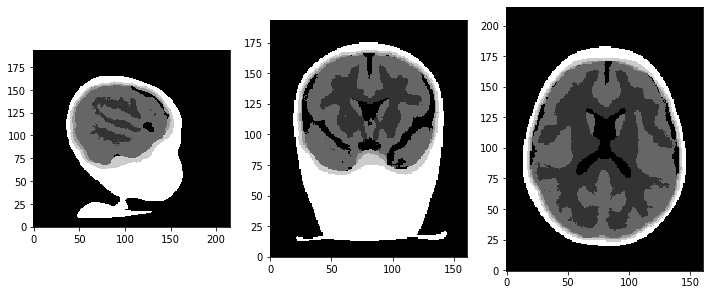

In [23]:
epi_img = nib.load(str(root / "Infants" / "Sources" / "BEM" / "AVG12-0Months3T_segmented_BEM5.nii.gz"))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[125, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

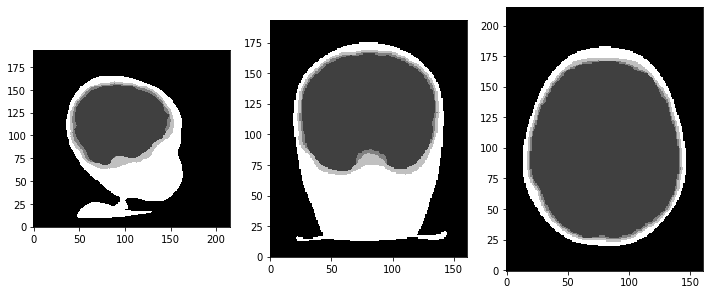

In [24]:
epi_img = nib.load(str(root / "Infants" / "Sources" / "BEM" / "AVG12-0Months3T_segmented_BEM4.nii.gz"))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[125, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

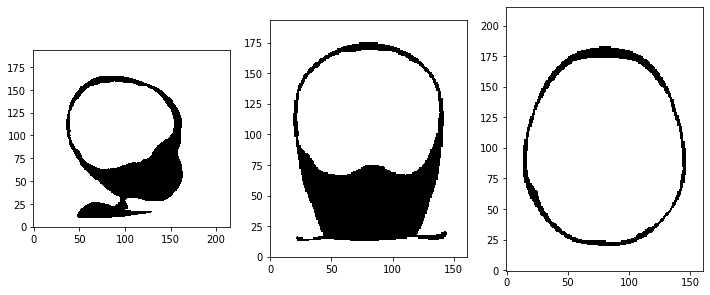

In [25]:
epi_img = nib.load(str(root / "Infants" / "Sources" / "BEM" / "AVG12-0Months3T_segmented_BEM3.nii.gz"))
epi_img_data = epi_img.get_fdata()
epi_img_data[np.where(epi_img_data == 0)] = np.nan # outside
epi_img_data[np.where(epi_img_data == 1)] = np.nan # white matter
epi_img_data[np.where(epi_img_data == 2)] = np.nan # skin
#epi_img_data[np.where(epi_img_data == 3)] = np.nan # CSF
slice_0 = epi_img_data[125, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

Following exchange with John Richards and Eric Larson, we concluded that BEM4 files are best to use to be able to extract the inside surface of the skull.

# Extracting BEM surfaces

Three-layes BEM are provided by Richards and al. as a volumetric dataset. To extract the surfaces, we use the marching cube algorithm followed by a Laplacian smoothing. We decimated the original surface to keep 5120 triangles, mainly for computational reasons. 

The volume for ANTS3-0Years3T need some artifact correction.

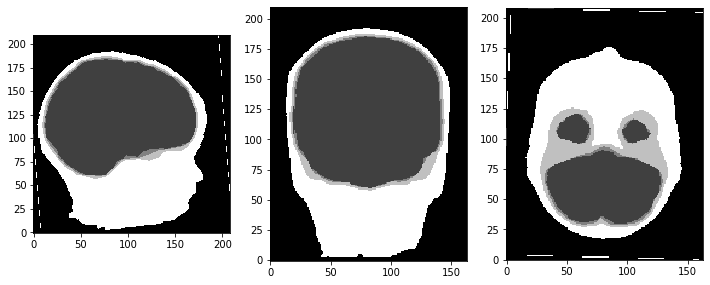

In [30]:
bem_path = root / "Preschool" / "Sources" / "BEM" / "AVG3-0Years3T_segmented_BEM4.nii.gz"
epi_img = nib.load(str(bem_path))
epi_img_data = deepcopy(epi_img.get_fdata())   

slice_0 = epi_img_data[75, :, :]
slice_1 = epi_img_data[:, 75, :]
slice_2 = epi_img_data[:, :, 75]
show_slices([slice_0, slice_1, slice_2])

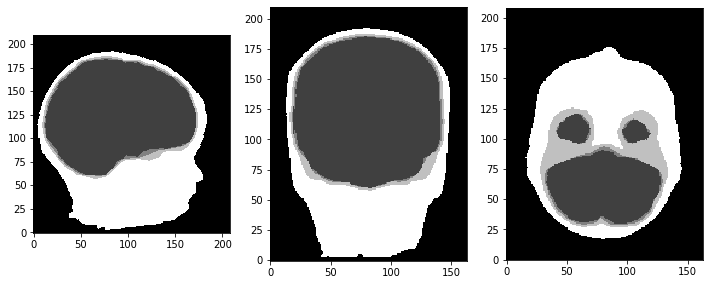

In [31]:
correct_line_artefact(epi_img_data)

slice_0 = epi_img_data[75, :, :]
slice_1 = epi_img_data[:, 75, :]
slice_2 = epi_img_data[:, :, 75]
show_slices([slice_0, slice_1, slice_2])

#### Extracting, correcting, and saving BEM meshes

In [ ]:
for root_subset in [root / "Infants", root / "Preschool"]:
    for bem_path in (root_subset / "Sources" / "BEM").glob("AVG*3T_segmented_BEM4.nii.gz"):
        print(bem_path)
        process_bem(bem_path)

# Coregistering the head with the brain model

### Code used to generate the transforms.npz files

This process was done by iteratively by first adjusting the rotation using FreeView and manually adjusting the translation and scaling in Python, verifying the fit back in FreeView.

In [362]:
run_code = False

subject_number = 11
if run_code:
    subject = subjects[subject_number]
    path = fs_subject_path + subject

    (fs_subject_path / (subject + "_brain") / "bem").mkdir(parents=True, exist_ok=True)

    with open("{}/man.lta".format(path), "r") as f: 
        M = np.array([line.split() for line in f.readlines()[5:9]], dtype=float)

    translation = np.identity(4)

    scales = np.sqrt((M**2).sum(0))
    scales[3] = 1
    scaling = np.diag(scales)

    rotation = M / scales
    rotation[:, 3] = [0, 0, 0, 1]        

    translation[0, 3] += 0 # left (on freeview; right anatomically)
    translation[1, 3] += 0 # bottom
    translation[2, 3] += 0 # front

    scaling[0, 0] *= 1.01 # lateral 
    scaling[1, 1] *= 1.01 # vertical 
    scaling[2, 2] *= 1.01 # frontal

    bem_surfs = ["outer_skull.surf", "outer_skin.surf", "inner_skull.surf"]
    for surf in bem_surfs:
        print("Processing {}...".format(surf))
        vertices2, simplices2, volume_info = read_geometry(fs_subject_path / subject / "bem" / surf, 
                                                           read_metadata=True)   

        M2 = np.identity(4)
        M2[:3, :3] = np.stack([volume_info["xras"], volume_info["yras"], volume_info["zras"]])
        M2[0, :] *= -1

        v2 = np.hstack([vertices2, np.ones((vertices2.shape[0], 1))])
        v2 = ( (M2.T @ translation @ scaling @ rotation @ M2) @ v2.T ).T[:, :3]           

        (fs_subject_path / (subject + "_brain") / "bem").mkdir(parents=True, exist_ok=True)
        write_geometry(str(fs_subject_path / (subject + "_brain") / "bem" / surf), 
                           v2[:, :3], simplices2, volume_info=volume_info)      

    np.savez(str(fs_subject_path / (subject + "_brain") / "transforms.npz"), 
            translation=translation, rotation=rotation, scaling=scaling)

    freeview_cmd = ["freeview", "-v",
                    str(fs_subject_path / (subject + "_brain") / "mprage.nii.gz"),
                    "-f", 
                    str(fs_subject_path / (subject + "_brain") / "surf" / "lh.pial") + ":edgecolor=red",
                    str(fs_subject_path / (subject + "_brain") / "surf" / "rh.pial") + ":edgecolor=red",
                    str(fs_subject_path / (subject + "_brain") / "bem" / "inner_skull.surf") + ":edgecolor=purple"]

    subprocess.run(freeview_cmd)  

Processing outer_skull.surf...
Processing outer_skin.surf...
Processing inner_skull.surf...
/usr/local/freesurfer/subjects/ANTS2-0Years3T_brain/bem/inner_skull.surf


CompletedProcess(args=['freeview', '-v', '/usr/local/freesurfer/subjects/ANTS2-0Years3T_brain/mprage.nii.gz', '-f', '/usr/local/freesurfer/subjects/ANTS2-0Years3T_brain/surf/lh.pial:edgecolor=red', '/usr/local/freesurfer/subjects/ANTS2-0Years3T_brain/surf/rh.pial:edgecolor=red', '/usr/local/freesurfer/subjects/ANTS2-0Years3T_brain/bem/inner_skull.surf:edgecolor=purple'], returncode=0)

In [98]:
def rot_mat_to_angles(rot_mat):
    beta = np.arcsin(-rot_mat[2, 0])
    gamma = np.arcsin(rot_mat[2, 1]/np.cos(beta))
    alpha = np.arccos(rot_mat[0, 0]/np.cos(beta))
    return np.degrees([gamma, beta, alpha])
    
transform_params = {}    
for subject in subjects:
    with np.load(str(fs_subject_path / (subject + "_brain") / "transforms.npz")) as transforms:
        transform_params[subject] =  np.concatenate([np.round(transforms["translation"][:3, 3], 3),
                                                     np.round(np.diag(transforms["scaling"][:3]), 3),
                                                     np.round(rot_mat_to_angles(transforms["rotation"]), 3)])

transform_df = pd.DataFrame(transform_params).T
transform_df.columns = ["$t_x$", "$t_y$", "$t_z$", "$s_x$", "$s_y$", "$s_z$", "$r_\gamma$", "$r_\\beta$", "$r_\\alpha$"]
transform_df.index = [ages[template + "_brain"] for template in transform_df.index]
transform_df

,$t_x$,$t_y$,$t_z$,$s_x$,$s_y$,$s_z$,$r_\gamma$,$r_\beta$,$r_\alpha$
2 weeks,0.0,-3.0,0.0,1.175,1.105,1.090,-7.000,-0.0,0.0
1 month,0.0,-3.0,0.0,1.200,1.070,1.060,-8.000,-0.0,0.0
2 months,0.0,-1.0,0.0,1.080,1.080,1.080,-8.000,-0.0,0.0
3 months,1.0,2.0,0.0,0.921,0.950,0.950,7.500,-0.0,0.0
4.5 months,0.0,2.0,-1.0,1.100,0.950,1.010,2.000,-0.0,0.0
6 months,-1.0,-5.0,-1.0,1.010,1.010,1.010,0.000,-0.0,0.0
7.5 months,-0.5,-4.0,0.0,1.010,1.000,1.010,-3.000,1.0,0.0
9 months,-0.5,-3.0,-2.0,1.050,1.000,1.020,-5.500,-0.0,1.5
12 months,1.0,-4.0,2.0,0.990,0.990,0.975,-9.500,-0.0,0.0
15 months,1.0,-4.0,3.0,0.950,1.000,1.000,-8.000,-0.0,0.0


### Applying transforms.npz to transform the head bem surfaces to the brain average space

In [34]:
for subject in subjects:
    with np.load(str(fs_subject_path / (subject + "_brain") / "transforms.npz")) as transforms:
        translation = transforms["translation"] 
        scaling = transforms["scaling"] 
        rotation = transforms["rotation"] 

    bem_surfs = ["outer_skull_large.surf", "outer_skin_large.surf", "inner_skull_large.surf",
                 "outer_skull.surf", "outer_skin.surf", "inner_skull.surf"]
    for surf in bem_surfs:
        print("Processing {}...".format(surf))
        volume_info = read_geometry(fs_subject_path / subject / "bem" / surf.replace("_large", ""), 
                                                           read_metadata=True)[2] 

        M2 = np.identity(4)
        M2[:3, :3] = np.stack([volume_info["xras"], volume_info["yras"], volume_info["zras"]])
        M2[0, :] *= -1

        vertices2, simplices2 = read_geometry(fs_subject_path / subject / "bem" / surf)           
        
        v2 = np.hstack([vertices2, np.ones((vertices2.shape[0], 1))])
        v2 = ( (M2.T @ translation @ scaling @ rotation @ M2) @ v2.T ).T[:, :3]           

        (fs_subject_path / (subject + "_brain") / "bem").mkdir(parents=True, exist_ok=True)
        write_geometry(str(fs_subject_path / (subject + "_brain") / "bem" / surf), 
                           v2[:, :3], simplices2, volume_info=volume_info)      

        # Writing an obj mesh file
        with (fs_subject_path / (subject + "_brain") / "bem" / surf).with_suffix(".obj").open('w') as file_obj:
            file_obj.write(trimesh.exchange.obj.export_obj(trimesh.Trimesh(v2[:, :3], simplices2)))      

Processing outer_skull_large.surf...
Processing outer_skin_large.surf...
Processing inner_skull_large.surf...
Processing outer_skull.surf...
Processing outer_skin.surf...
Processing inner_skull.surf...
Processing outer_skull_large.surf...
Processing outer_skin_large.surf...
Processing inner_skull_large.surf...
Processing outer_skull.surf...
Processing outer_skin.surf...
Processing inner_skull.surf...
Processing outer_skull_large.surf...
Processing outer_skin_large.surf...
Processing inner_skull_large.surf...
Processing outer_skull.surf...
Processing outer_skin.surf...
Processing inner_skull.surf...
Processing outer_skull_large.surf...
Processing outer_skin_large.surf...
Processing inner_skull_large.surf...
Processing outer_skull.surf...
Processing outer_skin.surf...
Processing inner_skull.surf...
Processing outer_skull_large.surf...
Processing outer_skin_large.surf...
Processing inner_skull_large.surf...
Processing outer_skull.surf...
Processing outer_skin.surf...
Processing inner_skul

# Loading fiducials 

In [4]:
fiducial_labels = ["AC", "PC", "Nz", "Iz", "LPA", "RPA", "LMA", 
                   "RMA", "LEOG", "REOG", "LEMG", "REMG", 
                   "mid_EOG_nose", "Cz"]

In [5]:
import csv
montages = {}
fiducials = {}
head_fiducials = []
brain_fiducials = []
for subject in ages:
    age_str = parse("ANTS{}_brain", subject).fixed[0]
    paths = list(root.glob("*/Sources/Electrodes/AVG{}_fiducial_electrodes.txt".format(age_str)))
    #if len(paths) == 0:
    #    paths = list((root / "supplementary_electrodes").glob("{}_hydrocelgsn128_electrodes.txt".format(age_str)))
    print(paths[0])    
    
    #delta = volume_info_["cras"]/1000  
    with paths[0].open('r') as tsv_file:
        tsv_file.readline()
        reader = csv.reader(tsv_file, delimiter=' ', lineterminator='\n')
        # Positions in this files are in RAS

        fiducials[age_str] = {label: np.array([float(x), float(y), float(z)]) # - delta 
                                  for label, (_, x, y, z) in zip(fiducial_labels, reader)}            

    with np.load(str(fs_subject_path / subject / "transforms.npz")) as transforms:
        translation = transforms["translation"] 
        scaling = transforms["scaling"] 
        rotation = transforms["rotation"] 

    volume_info = read_geometry(fs_subject_path / subject / "bem" / "outer_skull.surf", 
                                                       read_metadata=True)[2] 

    M2 = np.identity(4)
    M2[:3, :3] = np.stack([volume_info["xras"], volume_info["yras"], volume_info["zras"]])
    M2[0, :] *= -1

    delta = volume_info["cras"] #/1000      
    delta = np.zeros(3)

    tmp = np.vstack((pd.DataFrame(fiducials[age_str]).values*1000 - delta.reshape((3, 1)), np.ones((1, 14))))
    tmp = ((M2.T @ translation @ scaling @ rotation @ M2) @ tmp).T[:, :3]/1000
    tmp = pd.DataFrame(tmp)
    tmp.index = list(fiducials[age_str].keys())

    head_fiducials.append(np.concatenate((tmp.loc["LPA"], 
                                          tmp.loc["Nz"], 
                                          tmp.loc["RPA"])))
    brain_fiducials.append(np.concatenate((tmp.loc["AC"], 
                                           tmp.loc["PC"])))


/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG2-0Weeks3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG1-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG2-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG3-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG4-5Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG6-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG7-5Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG9-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG12-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Preschool/Sources/Electrodes/AVG15-0

In [6]:
tmp = pd.DataFrame(np.stack(head_fiducials))
tmp.index = list(ages.values())
tmp.columns = ["LPA_x", "LPA_y", "LPA_z", "NAS_x", "NAS_y", "NAS_z", "RPA_x", "RPA_y", "RPA_z"]
tmp*1000

,LPA_x,LPA_y,LPA_z,NAS_x,NAS_y,NAS_z,RPA_x,RPA_y,RPA_z
2 weeks,-48.174998,0.892899,-34.963287,-1.175000,52.727041,3.116631,45.824998,-0.056139,-33.731858
1 month,-49.200002,-1.112109,-35.740789,-1.200000,51.286995,-5.356433,49.200002,-1.866746,-33.472700
2 months,-47.520000,-1.751661,-34.744079,0.000000,53.006219,-2.087083,46.440000,-4.659516,-32.154178
3 months,-47.839499,-1.261113,-43.368521,1.000000,52.845118,-10.373968,49.839499,-3.392858,-41.732775
4.5 months,-59.399995,-8.639274,-41.224659,-1.100000,57.063651,-14.351510,58.299995,-7.594641,-42.140925
6 months,-54.530000,-14.129922,-39.440023,2.030000,53.540041,-18.229905,54.550000,-16.149924,-38.430026
7.5 months,-57.302288,-13.387043,-38.313040,-1.477364,59.750219,-14.119601,54.860127,-11.362635,-39.521013
9 months,-59.184656,-18.387443,-40.129699,-0.879654,54.014841,-21.393560,56.333119,-17.567664,-39.336158
12 months,-56.420000,-11.167427,-39.926185,1.990000,59.987027,-21.911545,57.430000,-13.411721,-41.551908
15 months,-55.050000,-12.592723,-42.280314,1.950000,64.150393,-20.751370,56.100000,-15.424355,-40.872527


In [7]:
tmp = pd.DataFrame(np.stack(brain_fiducials))
tmp.index = list(ages.values())
tmp.columns = ["AC_x", "AC_y", "AC_z", "PC_x", "PC_y", "PC_z"]
tmp*1000

,AC_x,AC_y,AC_z,PC_x,PC_y,PC_z
2 weeks,72.849997,97.157858,88.876602,-1.175000,-19.872269,2.133691
1 month,76.800003,96.349675,87.658103,-1.200000,-19.484407,1.442127
2 months,70.200000,100.757515,89.357160,-1.080000,-21.840713,0.797671
3 months,61.818999,71.030927,91.672778,0.078500,-18.837452,-4.479998
4.5 months,73.699994,85.662868,86.398657,-1.100000,-22.232326,-1.746824
6 months,69.700000,97.979820,108.020173,-2.010000,-23.220002,6.009961
7.5 months,79.257966,113.211733,105.201080,-1.878582,-21.107229,6.097685
9 months,75.602180,115.985073,100.282941,-1.634956,-24.238927,6.076762
12 months,81.190000,131.364721,93.410787,0.010000,-18.669539,4.501970
15 months,78.900000,133.180151,96.785417,0.050000,-20.905609,6.349887


In [8]:
import csv
montages = {}
for subject in ages:
    age_str = parse("ANTS{}_brain", subject).fixed[0]
    paths = list(root.glob("*/Sources/Electrodes/AVG{}_HGSN128_electrodes.txt".format(age_str)))
    if len(paths) == 0:
        paths = list((root / "supplementary_electrodes").glob("{}_hydrocelgsn128_electrodes.txt".format(age_str)))
    print(paths[0])    
    
    with paths[0].open('r') as tsv_file:
        tsv_file.readline()
        reader = csv.reader(tsv_file, delimiter=' ', lineterminator='\n')
        # Positions in this files are in RAS
        
        with np.load(str(fs_subject_path / subject / "transforms.npz")) as transforms:
            translation = transforms["translation"] 
            scaling = transforms["scaling"] 
            rotation = transforms["rotation"] 

        volume_info = read_geometry(fs_subject_path / subject / "bem" / "outer_skull.surf", 
                                                           read_metadata=True)[2] 

        M2 = np.identity(4)
        M2[:3, :3] = np.stack([volume_info["xras"], volume_info["yras"], volume_info["zras"]])
        M2[0, :] *= -1
        
        delta = volume_info["cras"] #/1000        

        ch_pos = {"E{}".format(ch_name):((M2.T @ translation @ scaling @ rotation @ M2) @ \
                  np.hstack([np.array([[float(x), float(y), float(z)]])*1000 - delta, [[1]]]).T).T[0, :3]/1000 
                  for ch_name, x, y, z in reader if ch_name != "name"}

        tmp = np.vstack((pd.DataFrame(fiducials[age_str]).values*1000 - delta.reshape((3, 1)), np.ones((1, 14))))
        brain_fiducials = ((M2.T @ translation @ scaling @ rotation @ M2) @ tmp).T[:, :3]/1000
        brain_fiducials = pd.DataFrame(brain_fiducials)
        brain_fiducials.index = list(fiducials[age_str].keys())
        
        ch_pos["E129"] = brain_fiducials.loc["Cz"].values # Reference channel        

    montage = mne.channels.make_dig_montage(ch_pos=ch_pos,
                                            #  These fiducials are in RAS space
                                            nasion=brain_fiducials.loc["Nz"].values,
                                            lpa=brain_fiducials.loc["LPA"].values,
                                            rpa=brain_fiducials.loc["RPA"].values,
                                            hsp=np.array(list(brain_fiducials.values)),
                                            coord_frame="head")    

    #trans = mne.read_trans(str(fs_subject_path / subject / "{}-trans.fif".format(subject)), return_all=True)
    #transform = trans[0]["trans"] @ np.diag(scales[subject])
    dig_copy = deepcopy(montage.dig)
    #for dig_chan in dig_copy:
    #    dig_chan["r"] = np.array((transform @ np.concatenate((dig_chan["r"], [1])))[:3]) 
    #    #dig_chan["r"] += volume_info["cras"]/1000.0

    coregistered_montage = mne.channels.DigMontage(dig=dig_copy, ch_names=montage.ch_names)
    montage_fname = fs_subject_path / subject / "GSN-HydroCel-129-montage.fif"
    #save_sfp_montage(coregistered_montage, montage_fname)
    montage.save(montage_fname)
    montages[subject] = montage

/media/christian/ElementsSE/Richards/supplementary_electrodes/2-0Weeks3T_hydrocelgsn128_electrodes.txt
/media/christian/ElementsSE/Richards/supplementary_electrodes/1-0Months3T_hydrocelgsn128_electrodes.txt
/media/christian/ElementsSE/Richards/supplementary_electrodes/2-0Months3T_hydrocelgsn128_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG3-0Months3T_HGSN128_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG4-5Months3T_HGSN128_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG6-0Months3T_HGSN128_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG7-5Months3T_HGSN128_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG9-0Months3T_HGSN128_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG12-0Months3T_HGSN128_electrodes.txt
/media/christian/ElementsSE/Richards/supplementary_electrodes/15-0Months3T_h

In [197]:
# Tend to crash notebooks. Running it separately from ipython.
#cd /home/christian/synchedin/infants_atlas_modeling

import os
import mne
from pathlib import Path
from mayavi import mlab
from copy import deepcopy
from eegip import DatasetMng
from mne.viz import plot_alignment, set_3d_view

os.environ["ETS_TOOLKIT"] = "wx"
mlab.init_notebook(backend="png")
fs_subject_path = Path("/usr/local/freesurfer/subjects/")

dataset_mng = DatasetMng(config={}, dataset_name="eegip_london")
recording = list(dataset_mng.dataset.recordings.values())[0]
#ch_names = recording.preprocessed_raw.info["ch_names"]
#dig = recording.preprocessed_raw.info["dig"]

chan_name_map = {'Fp2': 'E9', 'Fz': 'E11', 'NAS': 'E17', 'Fp1': 'E22', 'F3': 'E24', 'F7': 'E33',
                 'C3': 'E36', 'T7': 'E45', 'P3': 'E52', 'LM': 'E57', 'P7': 'E58', 'Pz': 'E62',
                 'O1': 'E70', 'Oz': 'E75', 'O2': 'E83', 'P4': 'E92', 'P8': 'E96', 'RM': 'E100',
                 'C4': 'E104', 'T8': 'E108', 'F8': 'E122', 'F4': 'E124', 'Cz': 'E129'}


def save_images(subject_, montage_fname_, raw):
    montage = mne.channels.read_dig_fif(montage_fname_)
    #montage = mne.channels.read_custom_montage(montage_fname_, head_size=None, coord_frame="head")
    #montage = montages[subject]
    raw.rename_channels(chan_name_map)
    raw.rename_channels({"E{}".format(no):"EEG{:03}".format(no) for no in range(1, 130)})
    raw = raw.set_channel_types({name: "eeg" for name in raw.copy().pick("eog").ch_names})
    raw.set_montage(montage)
    
    #fig_ = plot_alignment(raw.info, eeg=['original', 'projected'], show_axes=False, 
    #                      trans=None, surfaces="head", coord_frame='head', dig=True, 
    #                      subject=subject_)    
    fig_ = plot_alignment(raw.info, eeg='projected', show_axes=False, 
                          trans=None, surfaces="head", coord_frame='head', 
                          subject=subject_)    
    

    set_3d_view(figure=fig_, azimuth=135, elevation=80)
    fig_.scene.save(subject_ + "_1.png")

    set_3d_view(figure=fig_, azimuth=45, elevation=80)
    fig_.scene.save(subject_ + "_2.png")

    set_3d_view(figure=fig_, azimuth=270, elevation=80)
    fig_.scene.save(subject_ + "_3.png")

    
    fig_ = plot_alignment(raw.info, eeg=['original', 'projected'], show_axes=True, 
                          trans=None, surfaces="head", coord_frame='head', dig=True, 
                          subject=subject_)    
    

    set_3d_view(figure=fig_, azimuth=135, elevation=80)
    fig_.scene.save(subject_ + "_clear_1.png")

    set_3d_view(figure=fig_, azimuth=45, elevation=80)
    fig_.scene.save(subject_ + "_clear_2.png")

    set_3d_view(figure=fig_, azimuth=270, elevation=80)
    fig_.scene.save(subject_ + "_clear_3.png")

    
for subject in ["ANTS2-0Weeks3T_brain", "ANTS1-0Months3T_brain", "ANTS2-0Months3T_brain", 
                "ANTS3-0Months3T_brain", "ANTS4-5Months3T_brain", "ANTS6-0Months3T_brain",
                "ANTS7-5Months3T_brain", "ANTS9-0Months3T_brain", "ANTS12-0Months3T_brain",
                "ANTS15-0Months3T_brain", "ANTS18-0Months3T_brain", "ANTS2-0Years3T_brain"]:
    print("Processing ", subject, "...")
    montage_fname = fs_subject_path / subject / "GSN-HydroCel-129-montage.fif"
    save_images(subject, str(montage_fname), deepcopy(recording.preprocessed_raw))    

Notebook initialized with png backend.
Processing  ANTS2-0Weeks3T_brain ...
Opening raw data file /home/christian/synchedout/eegip/eegip/tests/test_artifacts/derivatives/eegip_london_preprocessed/sub-s601/ses-m06/eeg/sub-s601_ses-m06_eeg.fif...
    Range : 0 ... 81499 =      0.000 ...   162.998 secs
Ready.
Processing  ANTS1-0Months3T_brain ...
Processing  ANTS2-0Months3T_brain ...
Processing  ANTS3-0Months3T_brain ...
Processing  ANTS4-5Months3T_brain ...
Processing  ANTS6-0Months3T_brain ...
Processing  ANTS7-5Months3T_brain ...
Processing  ANTS9-0Months3T_brain ...
Processing  ANTS12-0Months3T_brain ...
Processing  ANTS15-0Months3T_brain ...
Processing  ANTS18-0Months3T_brain ...
Processing  ANTS2-0Years3T_brain ...


/home/christian/synchedout/eegip/eegip/recording.py:209: RuntimeWarning: This filename (/home/christian/synchedout/eegip/eegip/tests/test_artifacts/derivatives/eegip_london_preprocessed/sub-s601/ses-m06/eeg/sub-s601_ses-m06_eeg.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  self._preprocessed_raw = mne.io.read_raw_fif(self.get_path("preprocessed_raw"), verbose=self.verbose)


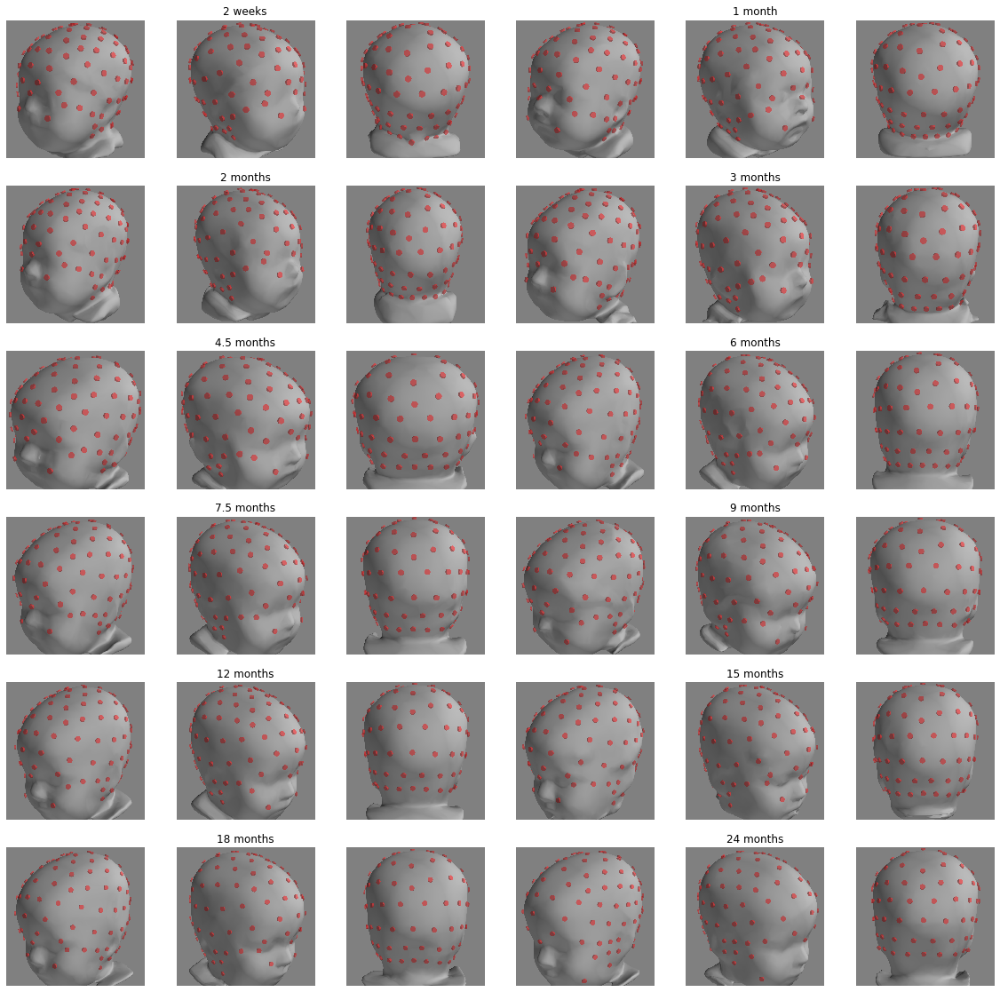

In [38]:
fig, axes = plt.subplots(6, 6, figsize=(20, 20))

def ax_gen(): 
    for ax_ in axes.ravel(): yield ax_

gen = ax_gen()      
for subject in ages:
    for i in [1, 2, 3]:
        ax = next(gen)
        img = mpimg.imread("{}_{}.png".format(subject, i))
        ax.imshow(img)
        ax.axis("off")        
        if i == 2:
            ax.set_title(ages[subject])

fig.savefig("sensor_coregistration.png")

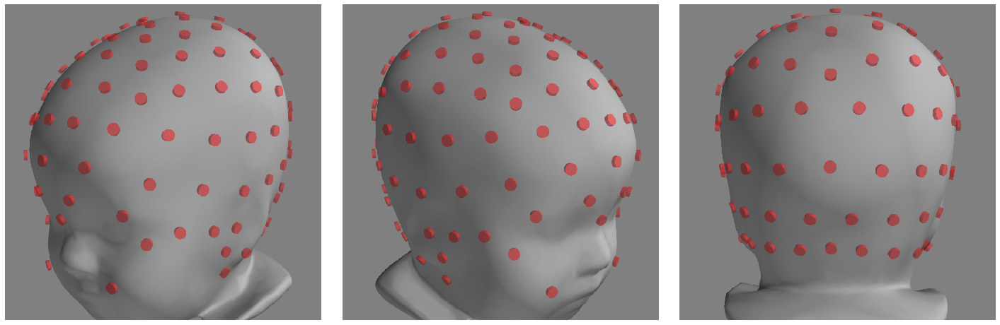

In [40]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6.5))

def ax_gen(): 
    for ax in axes.ravel(): yield ax

gen = ax_gen()      
subject = 'ANTS12-0Months3T_brain'
for i in [1, 2, 3]:
    ax = next(gen)
    img = mpimg.imread("{}_{}.png".format(subject, i))
    ax.imshow(img)
    ax.axis("off")        

fig.tight_layout()
fig.savefig("sensor_coregistration_example_12mo.png")

# Validating co-registration with MNE

Processing ANTS2-0Weeks3T_brain
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/bem/outer_skin.surf
Processing ANTS1-0Months3T_brain
Using surface: /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/bem/outer_skin.surf
Processing ANTS2-0Months3T_brain
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Months3T_brain/bem/outer_skin.surf
Processing ANTS3-0Months3T_brain
Using surface: /usr/local/freesurfer/subjects/ANTS3-0Months3T_brain/bem/in

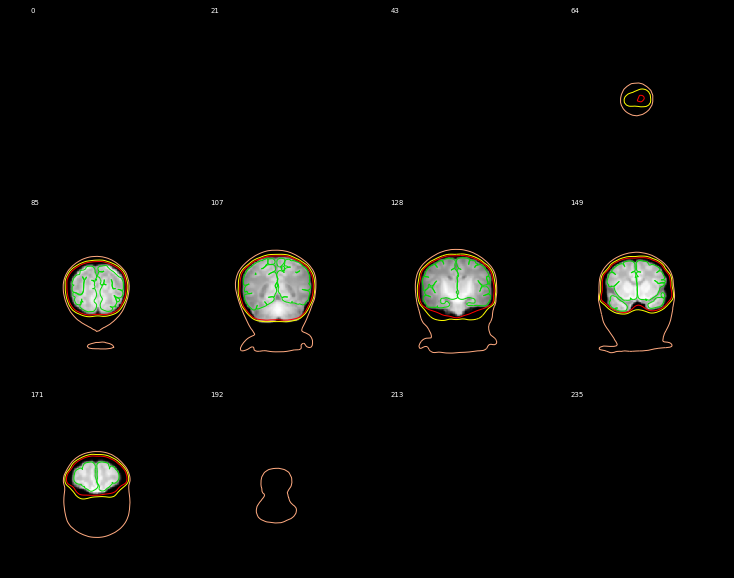

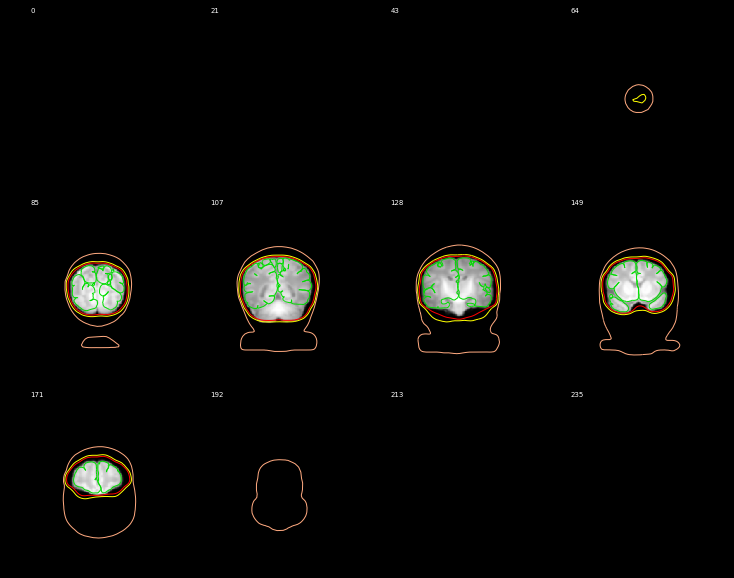

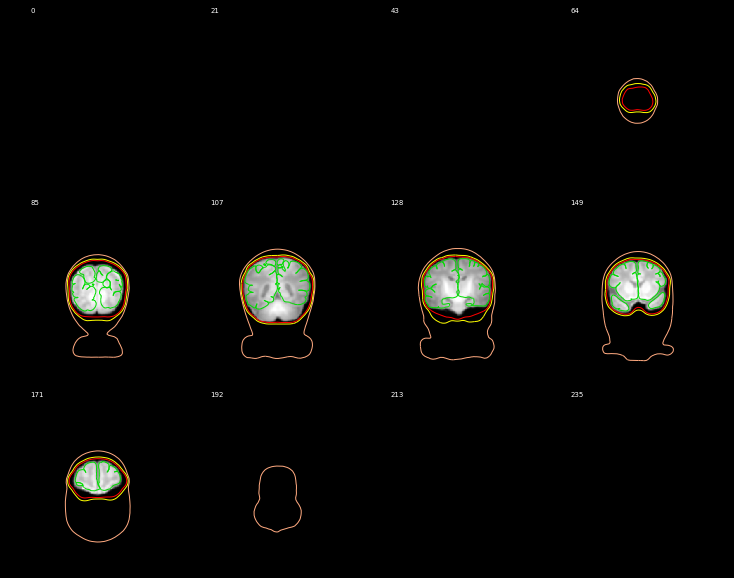

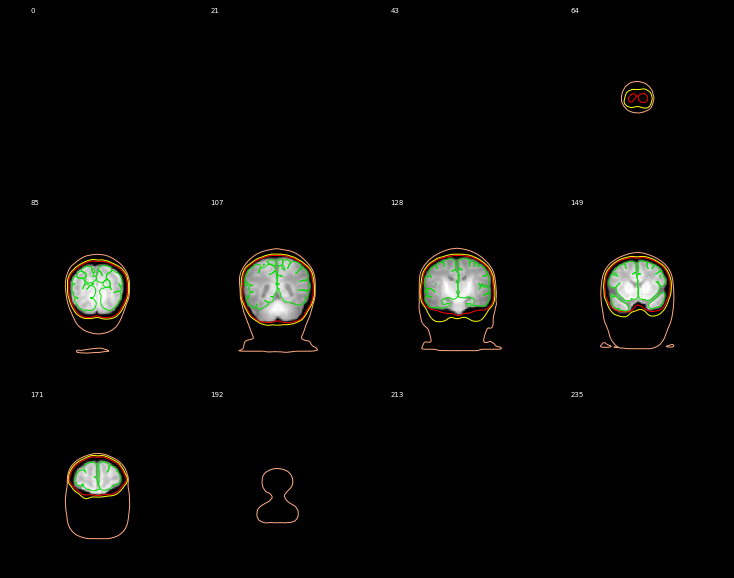

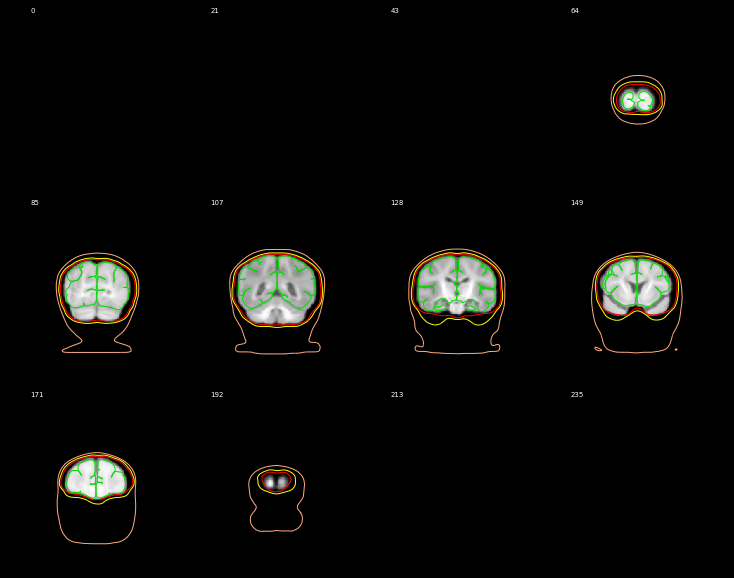

...

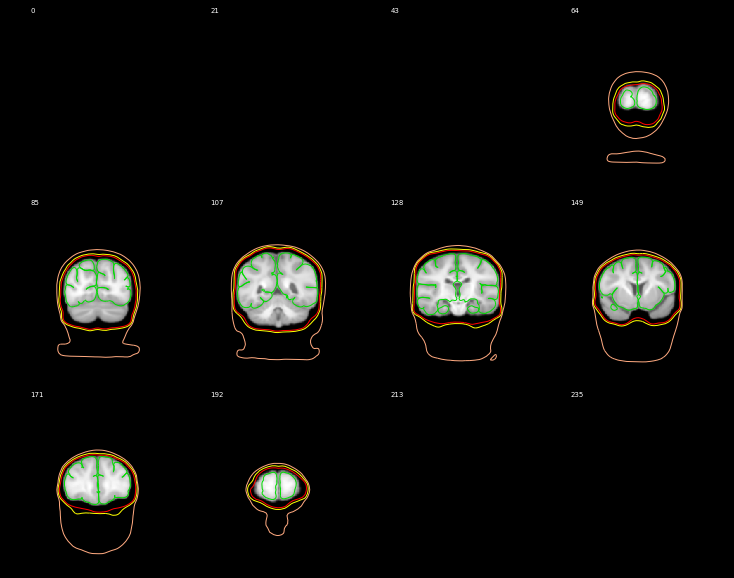

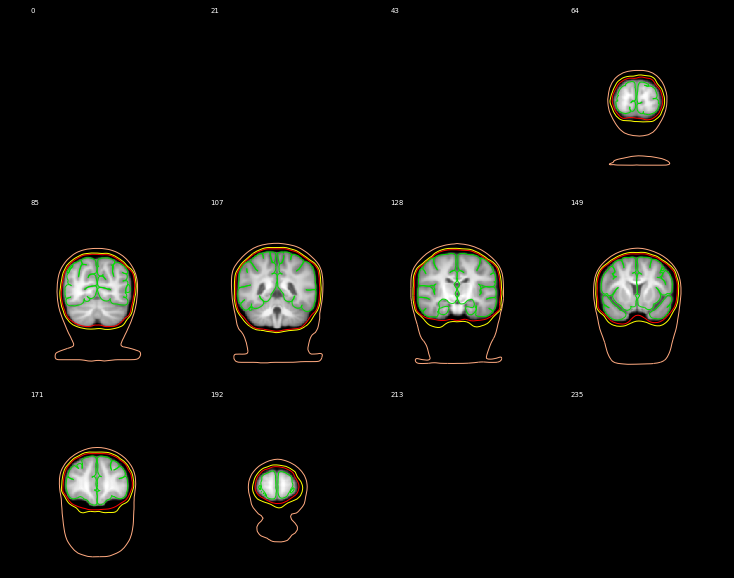

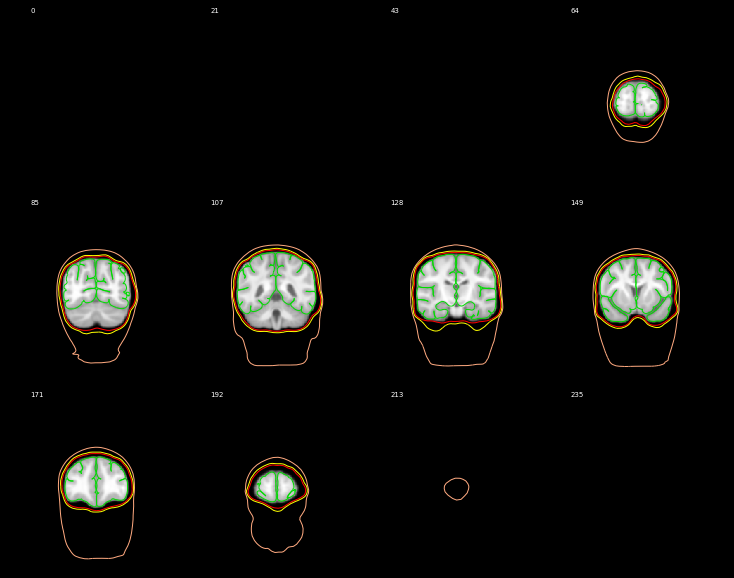

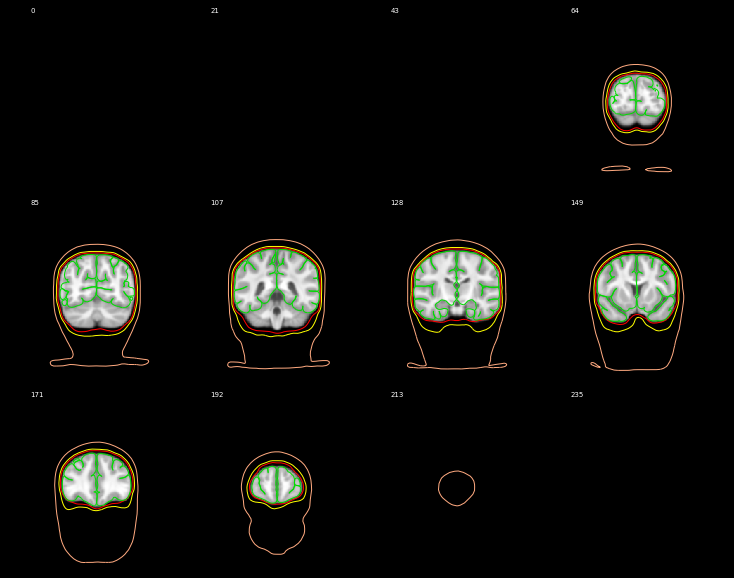

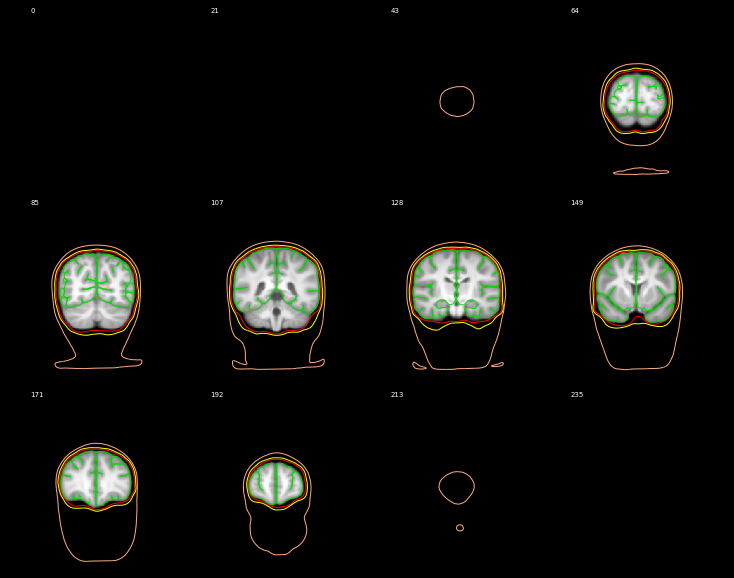

In [57]:
for subject in subjects:
    subject += "_brain" 
    print("Processing {}".format(subject))
    atlas = Atlas(subjects_dir=fs_subject_path, fs_subject=subject)
    fig = atlas.plot_bem(brain_surfaces='pial', orientation='coronal', show=False)
    fig.set_size_inches(10, 8, forward=True)        

# Verifying the meshes works for BEM modeling

In [8]:
for subject in tqdm(subjects):
    mne.make_bem_model(subject=subject + '_brain', ico=None) #4)

Creating the BEM geometry...
outer skin  CM is   1.00   2.90 -36.04 mm
outer skull CM is   0.81  -0.68  -1.44 mm
inner skull CM is   1.17  -1.17  -0.75 mm
Checking that outer skull surface is inside outer skin  surface...
Checking that inner skull surface is inside outer skull surface...
Checking distance between outer skin  and outer skull surfaces...
Minimum distance between the outer skin  and outer skull surfaces is approximately    1.2 mm
Checking distance between outer skull and inner skull surfaces...
Minimum distance between the outer skull and inner skull surfaces is approximately    1.6 mm
Surfaces passed the basic topology checks.
Complete.

Creating the BEM geometry...
outer skin  CM is  -1.88   9.88 -29.24 mm
outer skull CM is  -0.60   0.42  -1.98 mm
inner skull CM is  -0.64   0.06  -1.47 mm
Checking that outer skull surface is inside outer skin  surface...
Checking that inner skull surface is inside outer skull surface...
Checking distance between outer skin  and outer sk

In [4]:
for subject in tqdm(subjects):
    print("Processing {}".format(subject))
    try:
        check_bem(subject + "_brain")
    except RuntimeError as e:
        print("################################################################")   
        print("################################################################")   
        print("################################################################")   
        print("################################################################")   
        print("Runtime error for {}".format(subject)) 
        print(e)
        raise 

Processing ANTS2-0Weeks3T
Setting up the source space with the following parameters:

SUBJECTS_DIR = /usr/local/freesurfer/subjects
Subject      = ANTS2-0Weeks3T_brain
Surface      = white
Octahedron subdivision grade 6

>>> 1. Creating the source space...

Doing the octahedral vertex picking...
Loading /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/surf/lh.white...
Mapping lh ANTS2-0Weeks3T_brain -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/surf/lh.sphere...
Setting up the triangulation for the decimated surface...
loaded lh.white 4098/46734 selected to source space (oct = 6)

Loading /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/surf/rh.white...
Mapping rh ANTS2-0Weeks3T_brain -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS2-0Weeks3T_brain/surf/rh.sphere...
Setting up the triangulation for the decimated surface...
lo

Source spaces are in MRI coordinates.
Checking that the sources are inside the surface and at least    5.0 mm away (will take a few...)
    Skipping interior check for 18 sources that fit inside a sphere of radius   30.3 mm
    Skipping solid angle check for 0 points using Qhull
18 sources remaining after excluding the sources outside the surface and less than    5.0 mm inside.
Adjusting the neighborhood info.

Selecting voxels from Right-Putamen
34 sources remaining after excluding sources too far from VOI voxels
Source spaces are in MRI coordinates.
Checking that the sources are inside the surface and at least    5.0 mm away (will take a few...)
    Skipping interior check for 33 sources that fit inside a sphere of radius   30.3 mm
    Skipping solid angle check for 0 points using Qhull
34 sources remaining after excluding the sources outside the surface and less than    5.0 mm inside.
Adjusting the neighborhood info.

Selecting voxels from Right-Thalamus
65 sources remaining after e

    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/surf/lh.sphere...
Setting up the triangulation for the decimated surface...
loaded lh.white 4098/46028 selected to source space (oct = 6)

Loading /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/surf/rh.white...
Mapping rh ANTS1-0Months3T_brain -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS1-0Months3T_brain/surf/rh.sphere...
Setting up the triangulation for the decimated surface...
loaded rh.white 4098/48744 selected to source space (oct = 6)

You are now one step closer to computing the gain matrix
Creating the BEM geometry...
outer skin  CM is  -1.88   9.88 -29.24 mm
outer skull CM is  -0.60   0.42  -1.98 mm
inner skull CM is  -0.64   0.06  -1.47 mm
Checking that outer skull surface is inside outer skin  surface...
Checking that inner skull surface is inside outer skull surface...
Checking d


Selecting voxels from Right-Putamen
34 sources remaining after excluding sources too far from VOI voxels
Source spaces are in MRI coordinates.
Checking that the sources are inside the surface and at least    5.0 mm away (will take a few...)
    Skipping interior check for 31 sources that fit inside a sphere of radius   29.9 mm
    Skipping solid angle check for 0 points using Qhull
34 sources remaining after excluding the sources outside the surface and less than    5.0 mm inside.
Adjusting the neighborhood info.

Selecting voxels from Right-Thalamus
59 sources remaining after excluding sources too far from VOI voxels
Source spaces are in MRI coordinates.
Checking that the sources are inside the surface and at least    5.0 mm away (will take a few...)
    Skipping interior check for 59 sources that fit inside a sphere of radius   29.9 mm
    Skipping solid angle check for 0 points using Qhull
59 sources remaining after excluding the sources outside the surface and less than    5.0 mm 


You are now one step closer to computing the gain matrix
Creating the BEM geometry...
outer skin  CM is  -0.01   3.21 -38.30 mm
outer skull CM is   0.36  -2.79  -4.43 mm
inner skull CM is   0.48  -3.41  -2.97 mm
Checking that outer skull surface is inside outer skin  surface...


KeyboardInterrupt: 

# Making obj meshes from freesurfer brain (pial, wm) surfaces for visualization in blender

In [368]:
for subject in subjects:
    for file_name in ["lh.white", "rh.white", "lh.pial", "rh.pial"]:   
        path_fs = fs_subject_path / (subject + "_brain") / "surf" / file_name

        try:
            coords, faces = read_geometry(path_fs)
        except:
            raise

        bem_output_path = fs_subject_path / (subject + "_brain") / "bem" / file_name.replace(".", "_")
        bem_output_path = bem_output_path.with_suffix(".obj")
        bem_output_path.parent.mkdir(parents=True, exist_ok=True)

        mesh = trimesh.Trimesh(vertices=coords, faces=faces)
        with bem_output_path.open("w") as file_obj:
             file_obj.write(trimesh.exchange.obj.export_obj(mesh))

In [ ]:
# Blender code
"""
#----------------------------------------------------------
# File chain.py
# Creates an array modifier and applies it
# Update to API rev. 36523
#----------------------------------------------------------
import bpy, bmesh
import math
from math import pi
import numpy as np


def hex_to_rgb( hex_value ):
    b = (hex_value & 0xFF) / 255.0
    g = ((hex_value >> 8) & 0xFF) / 255.0
    r = ((hex_value >> 16) & 0xFF) / 255.0
    return r, g, b

def get_material(material_name, h):
    material = bpy.data.materials.get(material_name)
    if material is None:
        material = bpy.data.materials.new(material_name)
    material.use_nodes = True
    principled_bsdf = material.node_tree.nodes['Principled BSDF']
    if principled_bsdf is not None:
        # Base color
        principled_bsdf.inputs[0].default_value = (*hex_to_rgb(h), 1)  
        # Alpha
        principled_bsdf.inputs[18].default_value = 1.0  
        
    #material.use_transparency = False
    return material

def clear_scene():
    context = bpy.context
    scene = context.scene

    objs = bpy.data.objects
    for obj in objs:
        objs.remove(obj, do_unlink=True)
        
    # Save and re-open the file to clean up the data blocks
    bpy.ops.wm.save_as_mainfile(filepath=bpy.data.filepath)
    bpy.ops.wm.open_mainfile(filepath=bpy.data.filepath)


def add_camera():
    context = bpy.context
    scene = context.scene
    
    cam = bpy.data.cameras.new("main_cam")
    cam_obj = bpy.data.objects.new("main_cam", cam)
    bpy.context.collection.objects.link(cam_obj)
    cam_obj.location = (0, 0.03, 4)
    cam.clip_end = 5
    cam.clip_start = 0
    cam.lens = 140
    cam.display_size = 5
    cam.dof.focus_distance = 4
    cam_obj.rotation_euler[2] = 3.14159
    
    #scene.render.pixel_aspect_y = 4
    #scene.render.pixel_aspect_x = 3
    scene.render.film_transparent = True



def add_light():
    
    scene = bpy.context.scene

    # Create new lamp datablock
    lamp_data = bpy.data.lights.new(name="lamp", type='POINT')
    lamp_data.energy = 1000
    lamp_data.shadow_soft_size = 11

    # Create new object with our lamp datablock
    lamp_object = bpy.data.objects.new(name="lamp", object_data=lamp_data)

    # Link lamp object to the scene so it'll appear in this scene
    scene.collection.objects.link(lamp_object)

    # Place lamp to a specified location
    lamp_object.location = (-2.75692, -3.90951, 3.34581)

    # And finally select it make active
    bpy.context.view_layer.objects.active = lamp_object    


def import_subject(subject, pos, materials):
    for component in ["outer_skin", "outer_skull", "inner_skull"]:
        filepath = "/usr/local/freesurfer/subjects/{}/bem/{}_large.obj".format(subject, component)
        name = "{}_{}".format(subject, component)
        bpy.ops.import_scene.obj(filepath = filepath)
        imported_object = [obj for obj in bpy.data.objects if obj.tag is False][0]
        imported_object.name = name
        imported_object.scale = (1e-3, 1e-3, 1e-3)
        imported_object.location.xyz = pos
        imported_object.tag = True
        if component == "outer_skin":
            imported_object.active_material = materials["skin"]
        else:
            imported_object.active_material = materials["bones"]
                
        # Cut
        bm = bmesh.new()
        bm.from_mesh(imported_object.data)
        verts_to_delete = [g for g in bm.verts[:] if g.co[0] > pos[0] and g.co[2] > pos[2]]
        bmesh.ops.delete(bm, geom=verts_to_delete, context="VERTS")
        bm.to_mesh(imported_object.data)
        bm.free()   

        imported_object.rotation_euler[0] = 1.22173
        imported_object.rotation_euler[1] = -0.349066

    for component in ["lh_white", "rh_white", "lh_pial", "rh_pial"]:
        filepath = "/usr/local/freesurfer/subjects/{}/bem/{}.obj".format(subject, component)
        name = "{}_{}".format(subject, component)
        try:
            bpy.ops.import_scene.obj(filepath = filepath)
        except:
            return
        imported_object = [obj for obj in bpy.data.objects if obj.tag is False][0]
        imported_object.name = name
        imported_object.scale = (1e-3, 1e-3, 1e-3)
        imported_object.location.xyz = pos
        imported_object.tag = True
        imported_object.active_material = materials["pial"]
        
        imported_object.rotation_euler[0] = 1.22173
        imported_object.rotation_euler[1] = -0.349066     


def run():
    
    clear_scene()
    for obj in bpy.data.objects:
        obj.tag = True

    #babies = [["ANTS6-0Months3T", "ANTS7-5Months3T", "ANTS9-0Months3T"], 
    #          ["ANTS12-0Months3T", "ANTS18-0Months3T", "ANTS2-0Years3T"], 
    #          ["ANTS2-5Years3T", "ANTS3-0Years3T", "ANTS3-5Years3T"]]
    babies = [["ANTS6-0Months3T", "ANTS7-5Months3T", "ANTS9-0Months3T"], 
              ["ANTS12-0Months3T", "ANTS18-0Months3T", "ANTS2-0Years3T"]]

    materials = {}
    materials["skin"] = get_material("skin", 0xBD826E)
    materials["pial"] = get_material("pial", 0x737475)
    materials["bones"] = get_material("pial", 0xFFFFFF)

    y = -0.125
    for no_row, subject_row in enumerate(babies):
        x = 0.175
        for no_col, subject in enumerate(subject_row):
            import_subject(subject, [x, y, 0], materials)
            x -= 0.175
        y += 0.250


    bpy.context.scene.unit_settings.length_unit = 'MILLIMETERS'
    add_camera()
    add_light()


    return


if __name__ == "__main__":
    run()

""";

# Command to check the quality of the models in FreeView

In [59]:
for path in fs_subject_path.glob("ANTS*3T"):
    print("""
subject_path={path}
freeview -v $subject_path/brainmask.nii.gz \\
            $subject_path/mprage.nii.gz \\
         -f $subject_path/surf/lh.pial:edgecolor=red \\
            $subject_path/surf/rh.pial:edgecolor=red \\
            $subject_path/surf/lh.white:edgecolor=blue \\
            $subject_path/surf/rh.white:edgecolor=blue \\
            $subject_path/bem/outer_skin.surf:edgecolor=yellow \\
            $subject_path/bem/outer_skull.surf:edgecolor=purple \\
            $subject_path/bem/inner_skull.surf:edgecolor=yellow    
""".format(path=path))



subject_path=/usr/local/freesurfer/subjects/ANTS3-0Months3T
freeview -v $subject_path/mri/brainmask.mgz \
            $subject_path/mri/T1.mgz \
         -f $subject_path/surf/lh.pial:edgecolor=red \
            $subject_path/surf/rh.pial:edgecolor=red \
            $subject_path/surf/lh.white:edgecolor=blue \
            $subject_path/surf/rh.white:edgecolor=blue \
            $subject_path/bem/outer_skin.surf:edgecolor=yellow \
            $subject_path/bem/outer_skull.surf:edgecolor=purple \
            $subject_path/bem/inner_skull.surf:edgecolor=yellow    


subject_path=/usr/local/freesurfer/subjects/ANTS9-0Months3T
freeview -v $subject_path/mri/brainmask.mgz \
            $subject_path/mri/T1.mgz \
         -f $subject_path/surf/lh.pial:edgecolor=red \
            $subject_path/surf/rh.pial:edgecolor=red \
            $subject_path/surf/lh.white:edgecolor=blue \
            $subject_path/surf/rh.white:edgecolor=blue \
            $subject_path/bem/outer_skin.surf:edgecolor=yell

# Plotting the images of the Blender reconstruction

In [378]:
img = Image.open(str(image_output_path / "infants_atlas.png"))
draw = ImageDraw.Draw(img)
font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf", 120)
#font = ImageFont.load("arial.pil")

babies = [["2 weeks", "1 month", "2 months", "3 months"], 
          ["4.5 months", "6 months", "7.5 months", "9 months"], 
          ["12 months", "15 months", "18 months", "24 months"]]

#for height, babies_row in zip([1150, 2300, 3450], babies):
for height, babies_row in zip([1250, 2410, 3600], babies):
    dx = -1200
    for msg in babies_row:
        w, h = draw.textsize(msg,font=font)
        draw.text((img.width/2 - w/2 + dx, height),msg,(0,0,0),font=font)
        dx += 800
    
img.save(str(image_output_path / "infants_atlas_labeled.png"))

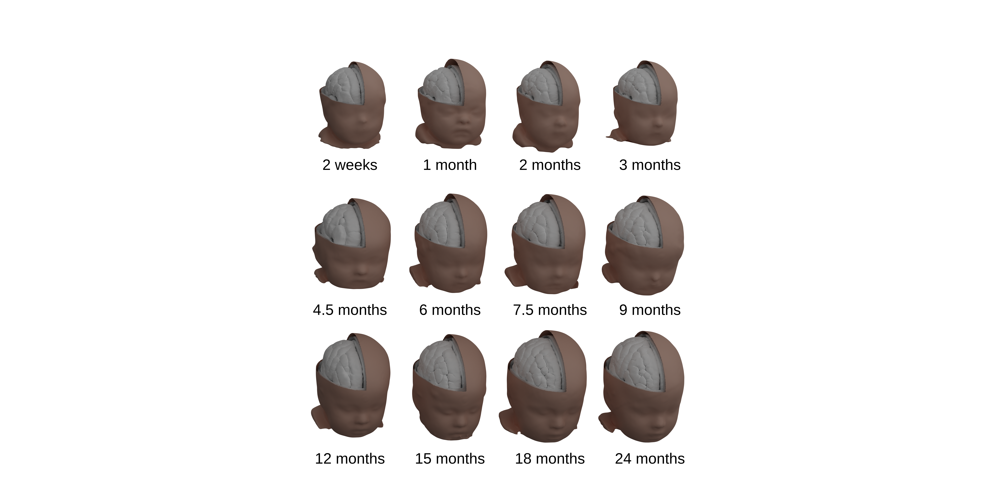

In [379]:
img